In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import csv

# import niezbędnych procedur pakietu scipy i scikit.learn
from scipy.cluster.hierarchy import linkage, dendrogram, ward, fcluster
from scipy.spatial.distance import cdist
from sklearn import metrics
from sklearn.cluster import AgglomerativeClustering,KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LinearRegression
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn import tree

# pakiet mlxtend wymaga wcześniejszej instalacji
# w razie problemów z instalacją przez anaconda navigator-a
# należy w Anaconda prompt wpisać:
# pip install mlxtend   
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules


In [3]:
# reading data
crime = pd.read_csv('../test.csv', delimiter=',',index_col='Id')
crime.head()

crimeTrain = pd.read_csv('../train.csv', delimiter=',')
crimeTrain


,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541
...,...,...,...,...,...,...,...,...,...
878044,2003-01-06 00:15:00,ROBBERY,ROBBERY ON THE STREET WITH A GUN,Monday,TARAVAL,NONE,FARALLONES ST / CAPITOL AV,-122.459033,37.714056
878045,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,INGLESIDE,NONE,600 Block of EDNA ST,-122.447364,37.731948
878046,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,SOUTHERN,NONE,5TH ST / FOLSOM ST,-122.403390,37.780266
878047,2003-01-06 00:01:00,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Monday,SOUTHERN,NONE,TOWNSEND ST / 2ND ST,-122.390531,37.780607


Opis danych w postaci liczbowej:


In [4]:

# liczba obiektów
count_objs = crime.shape[0]
print("liczba obiektow:", count_objs)

# liczba klas
classes_count = crime.groupby('PdDistrict').ngroups
print("liczba klas:", classes_count)


# liczba obiektów w każdej klasie
class_counts = {}

for pd_district in crime['PdDistrict']:
    if pd_district not in class_counts:
        class_counts[pd_district] = 1
    else:
        class_counts[pd_district] += 1

arr = list(class_counts.values())

for i, count in enumerate(arr):
    print(f"klasa {arr[i]}: {count} objects")

# liczba atrybutów
attr_count = crime.count()
print("liczba atrybutow:", len(attr_count))

# liczba danych brakujących
i=0
for col in crime:
    for item in crime[col]:
        if(pd.isnull(item) == True):
            i+=1
null_data = i
print("liczba brakujacych danych:", null_data)

# usunięcie danych brakujących
crime = crime.iloc[:,:].dropna()

#usunięcie duplikatów
crime = crime.drop_duplicates()


liczba obiektow: 884262
liczba klas: 10
klasa 89591: 89591 objects
klasa 107017: 107017 objects
klasa 80084: 80084 objects
klasa 66617: 66617 objects
klasa 120449: 120449 objects
klasa 86130: 86130 objects
klasa 81747: 81747 objects
klasa 44972: 44972 objects
klasa 157456: 157456 objects
klasa 50199: 50199 objects
liczba atrybutow: 6
liczba brakujacych danych: 0


Najczestsze przestepstwo:


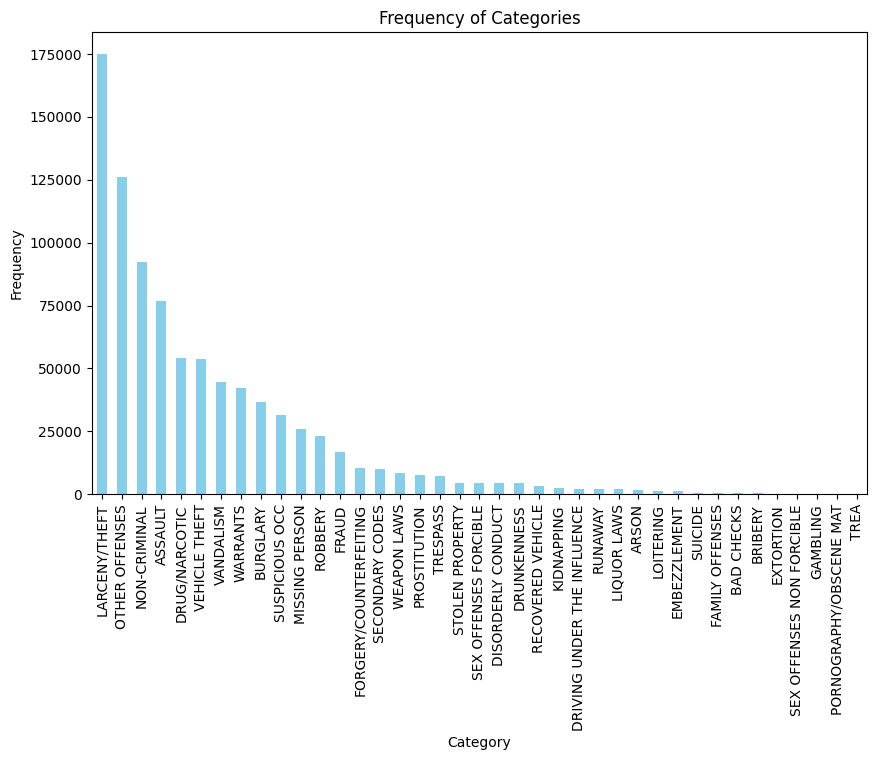

In [5]:
category_counts = crimeTrain['Category'].value_counts()

# Plotting
plt.figure(figsize=(10, 6))
category_counts.plot(kind='bar', color='skyblue')
plt.title('Frequency of Categories')
plt.xlabel('Category')
plt.ylabel('Frequency')
plt.show()

> Jak można zauważyc kradzież jest ogólnie najczętszym przestępstwem. Zobaczmy teraz jak to wygdąda w konkretnych sektorach:

/var/folders/2x/bpyzp64x54z5qzz1vqxytsvr0000gn/T/ipykernel_38107/1335280666.py:21: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


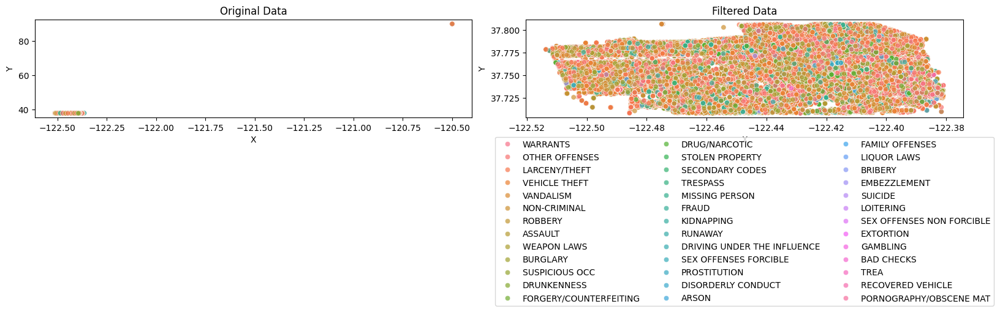

In [6]:
x_threshold = crimeTrain['X'].quantile(0.99)  # na przykład, wartość kwantyla 0.99
y_threshold = crimeTrain['Y'].quantile(0.99)

# Filtracja danych
filtered_data = crimeTrain[(crimeTrain['X'] < x_threshold) & (crimeTrain['Y'] < y_threshold)]

# Ustawienie większego rozmiaru obu wykresów
plt.figure(figsize=(16, 6))

# Pierwszy wykres
plt.subplot(1, 2, 1)
sns.scatterplot(x='X', y='Y', data=crimeTrain, hue='Category', alpha=0.7, legend=False)
plt.title('Original Data')

# Drugi wykres
plt.subplot(1, 2, 2)
sns.scatterplot(x='X', y='Y', data=filtered_data, hue='Category', alpha=0.7)
plt.title('Filtered Data')

# Dostosuj układ, aby uniknąć nakładania się legendy na pierwszym wykresie
plt.tight_layout()

# Dostosuj legendę
plt.legend(bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=3)

plt.show()

Na początku trzeba było przefiltrowac dane, gdyz pojawiały się błedne, nie odwołujące sie do rozpatrywanej lokalizaji. Mimo to jest ich zbyt gęsto aby coś wyłonić, dlatego spróbujmy przedstawic je na odzzielnych wykresach.


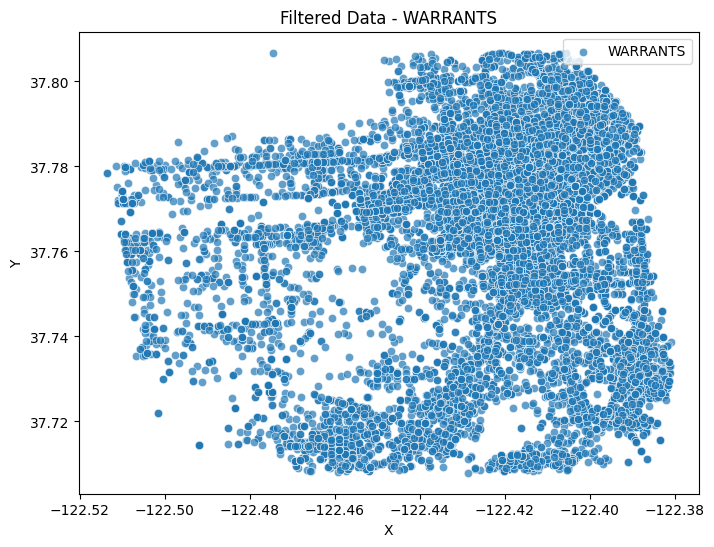

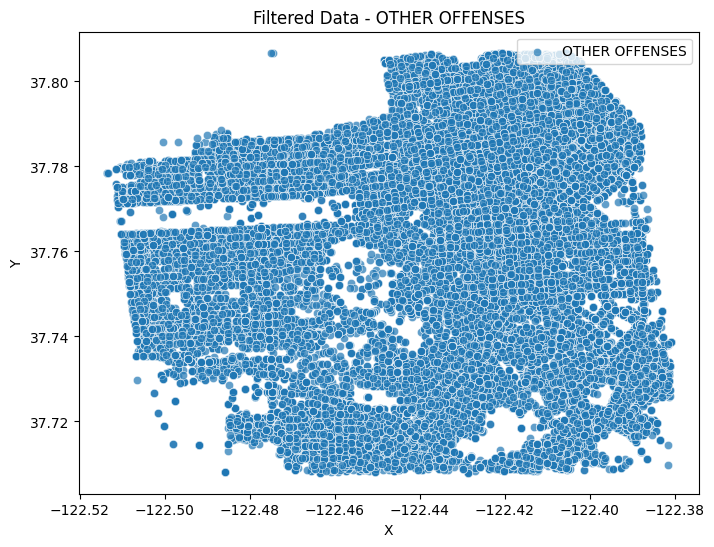

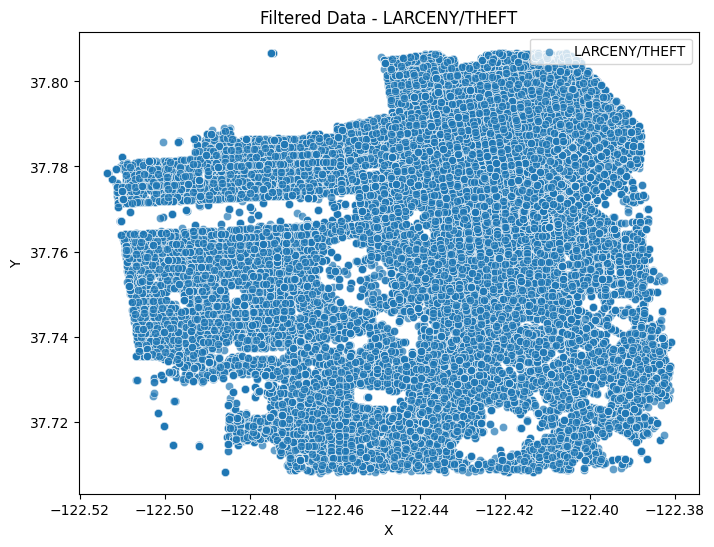

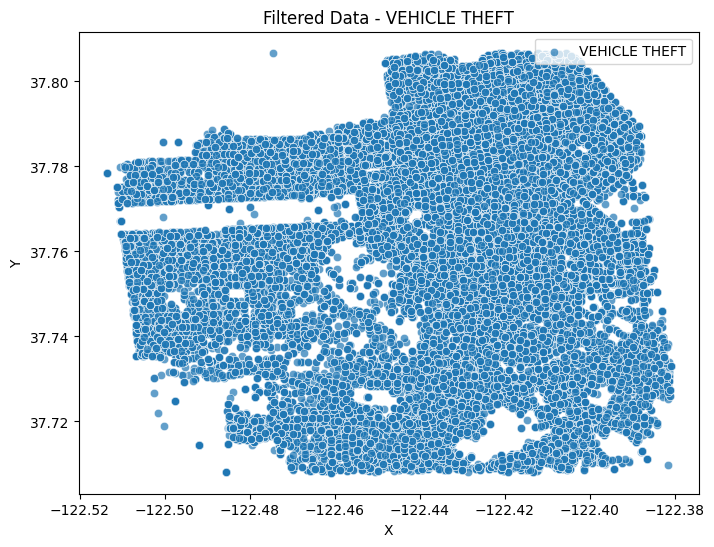

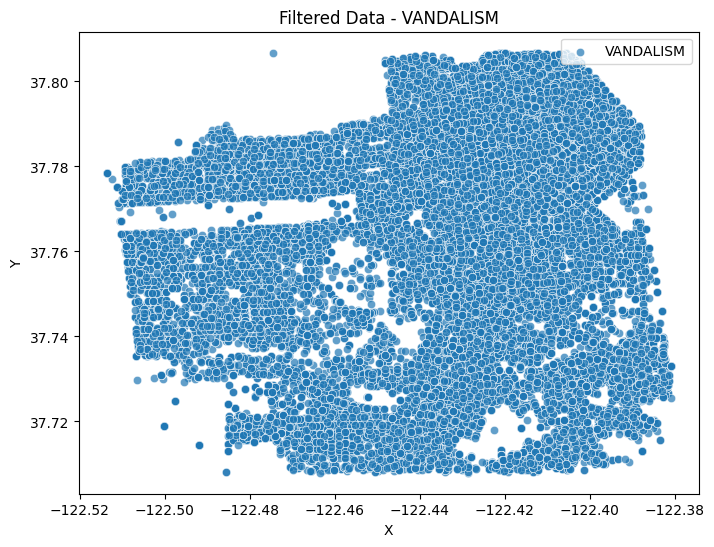

...

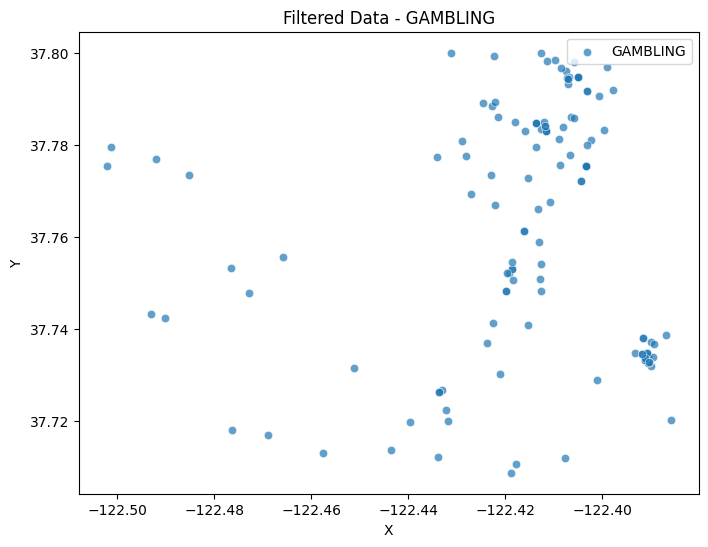

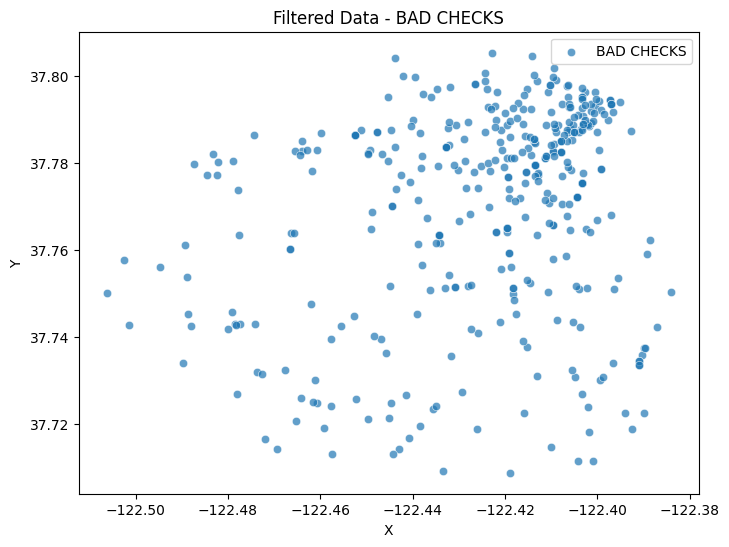

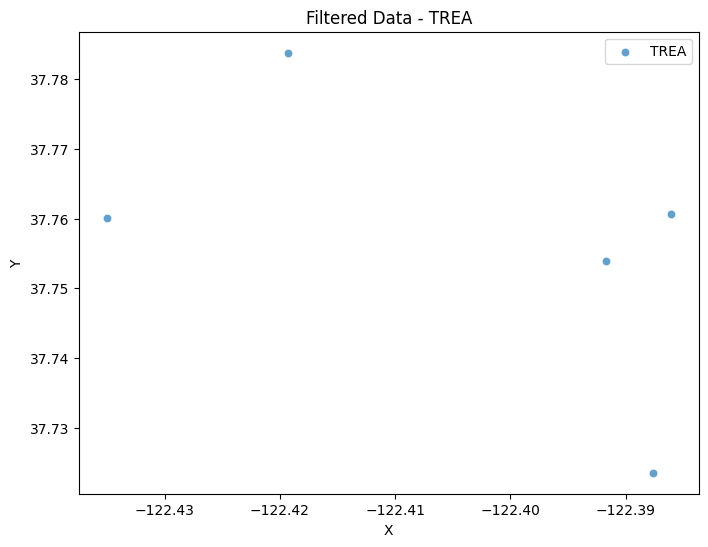

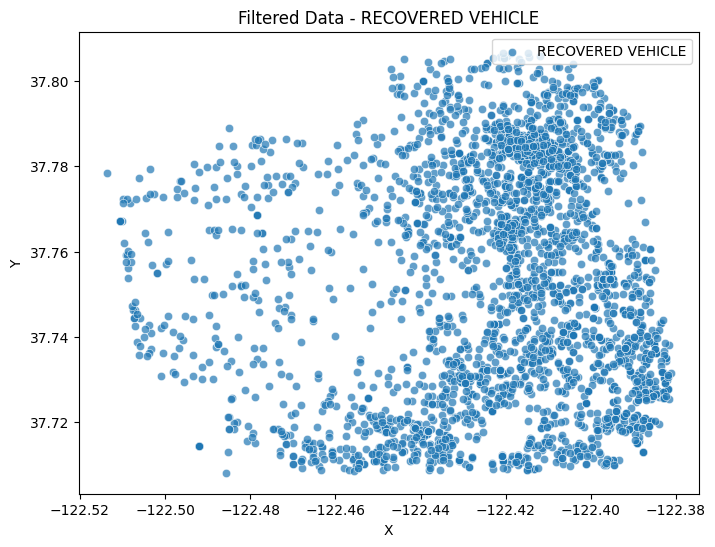

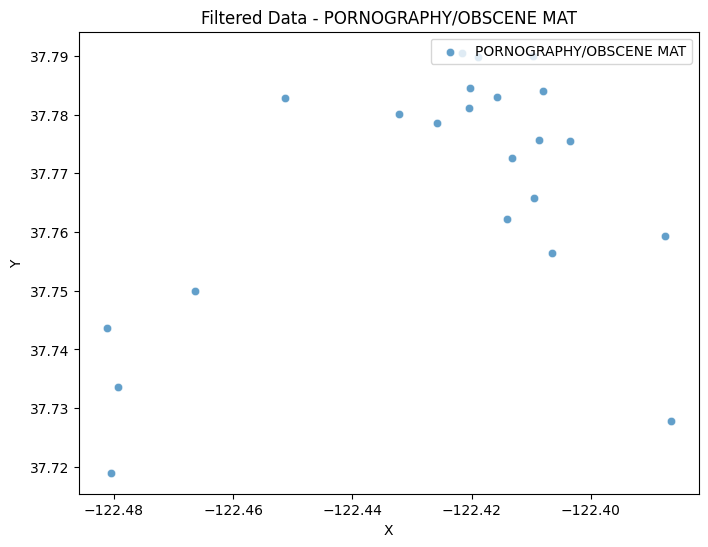

In [7]:
for category in filtered_data['Category'].unique():
    subset = filtered_data[filtered_data['Category'] == category]
    
    # Tworzenie osobnego wykresu dla każdej kategorii
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x='X', y='Y', data=subset, label=category, alpha=0.7)
    plt.title(f'Filtered Data - {category}')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend(loc='upper right')
    plt.show()

Co mozna zauważyć to to, że najczęstrze przestępstwa są wykonywane praktyczne na całym rozpatrywanym obszarze. Z koleji na co warto zwrocic uwage to np:
* Loitering
* Embezzlement
* Prostitution
* Drunkenness
Te kategorie przestępstw bardziej występują na północnym-wschodzie.

Zobaczmy teraz jak to wyglądało na przestrzeni lat:

<Figure size 1200x800 with 0 Axes>

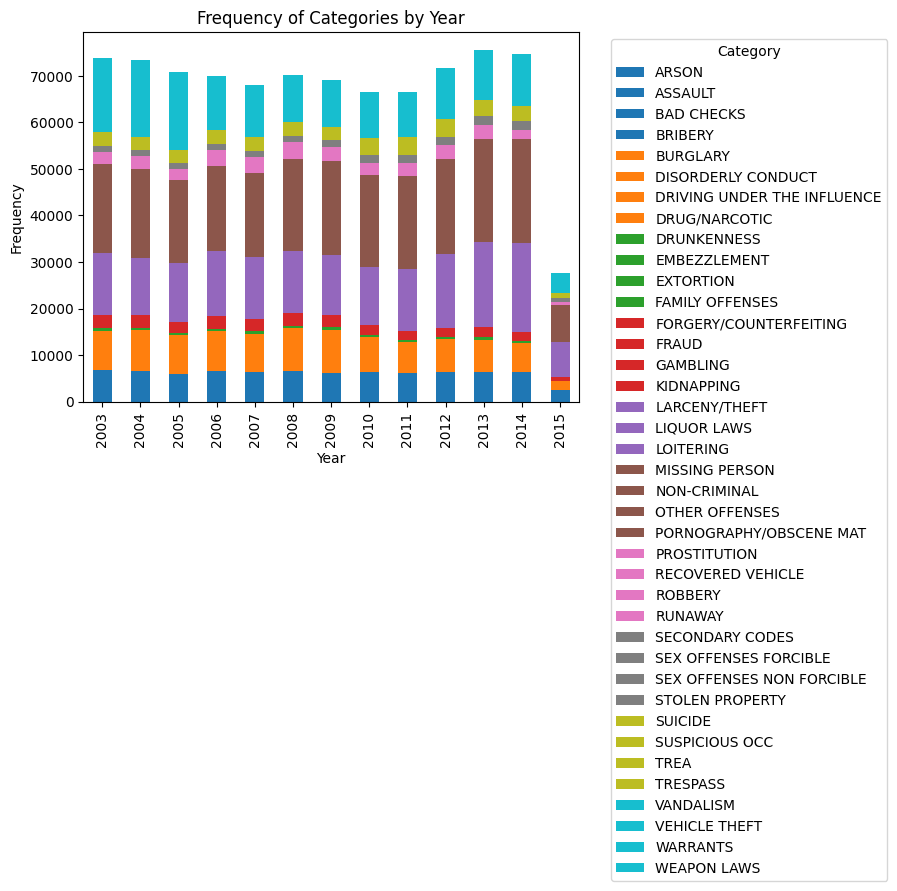

In [8]:
crimeTrain['Dates'] = pd.to_datetime(crimeTrain['Dates'])

# Dodaj kolumnę z rokiem
crimeTrain['Year'] = crimeTrain['Dates'].dt.year

# Liczba przestępstw dla każdej kategorii w poszczególnych latach
category_counts_by_year = crimeTrain.groupby(['Year', 'Category']).size().unstack(fill_value=0)

# Plotting
plt.figure(figsize=(12, 8))
category_counts_by_year.plot(kind='bar', stacked=True, cmap='tab10')
plt.title('Frequency of Categories by Year')
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

Widać że w latach 2005-2011 przestępstwa się uspokioły, do 2014 znowu wzrastały. 2015 mozemy pominac bo nie mamy pełnyc danych roku.
Górowały te same typy przestępstw, wiec występował gównie ten sam problem kradzierzy.

Mozemy rowniez sprawdzic, czestotliwosc przestepstw w dane dni tygodnia

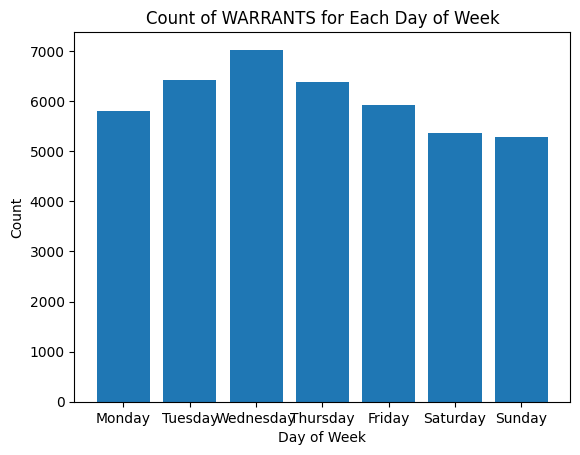

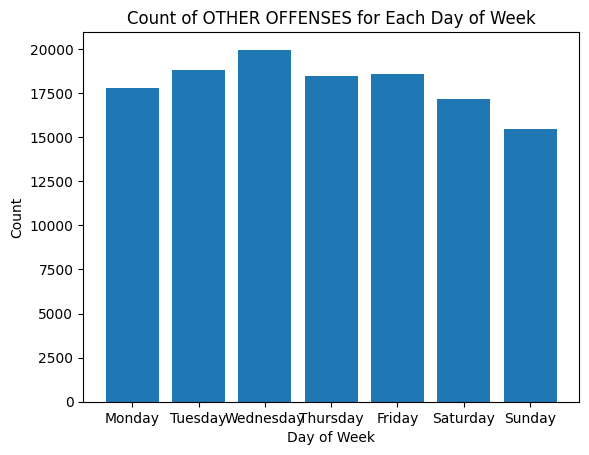

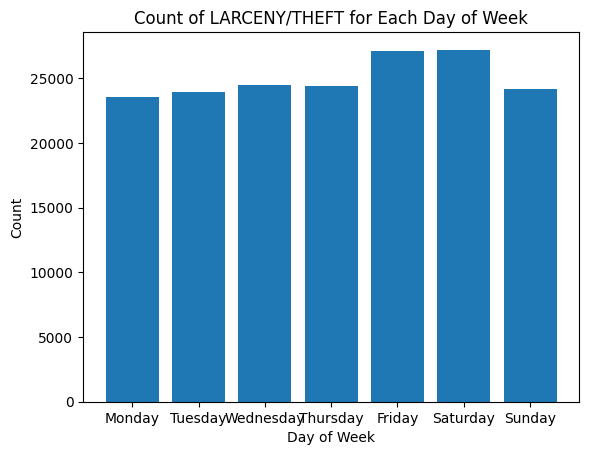

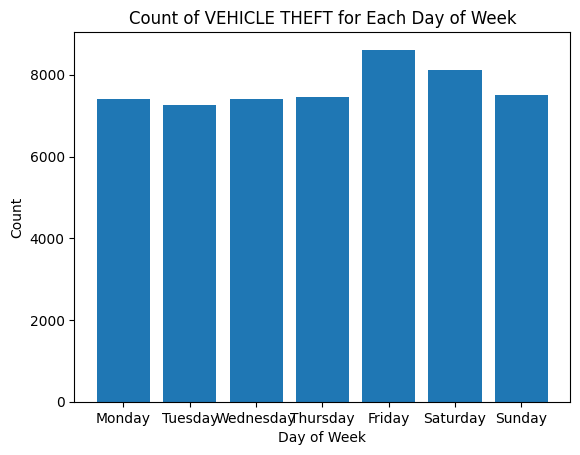

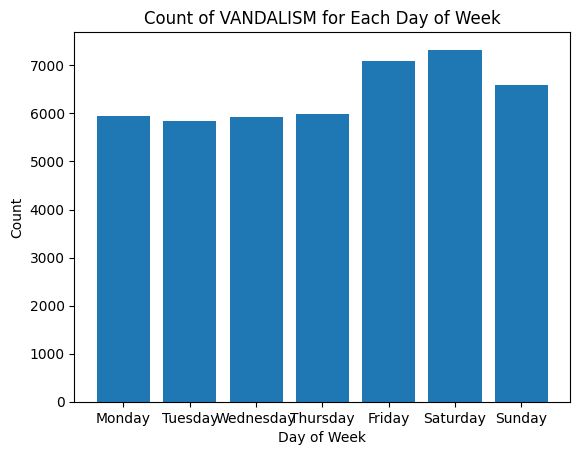

...

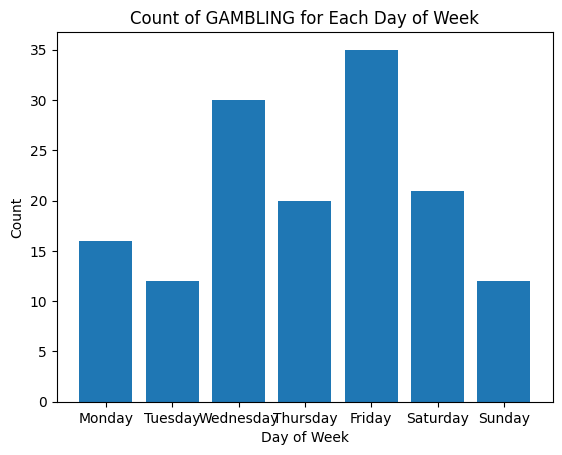

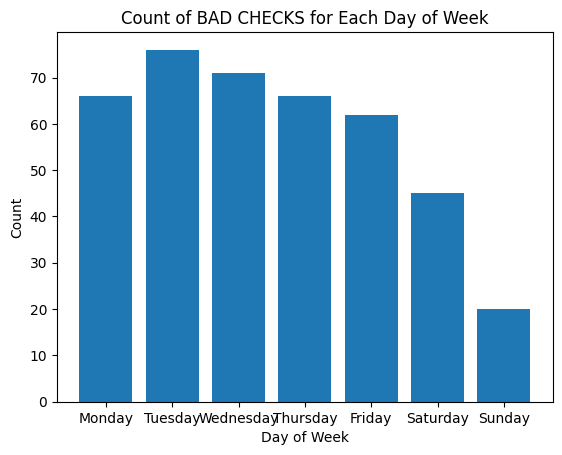

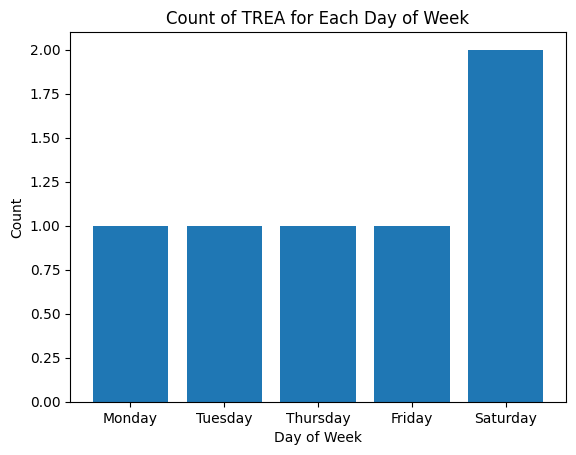

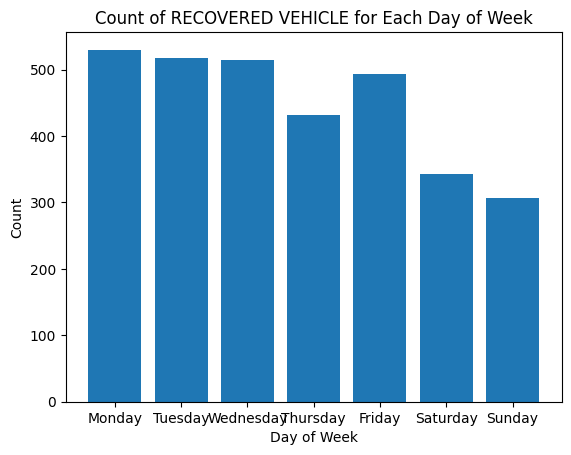

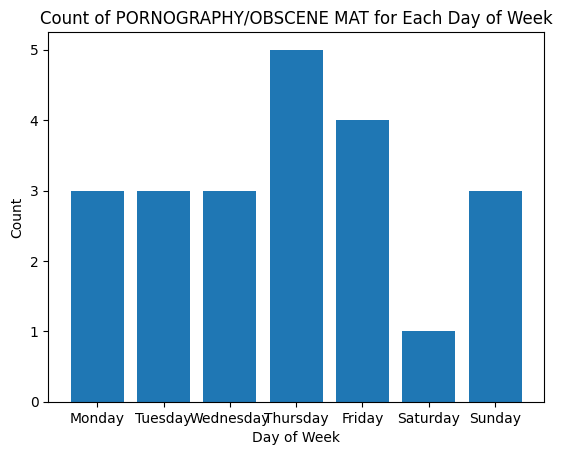

In [28]:
categories = crimeTrain['Category'].unique()
crimeTrain['DayOfWeek'] = pd.Categorical(crimeTrain['DayOfWeek'].str.capitalize(),
                                         categories=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
                                         ordered=True)

for category in categories:
    # Wybór danych dla danej kategorii
    category_data = crimeTrain[crimeTrain['Category'] == category]
    
    # Zliczanie wystąpień danej kategorii w danym dniu tygodnia
    grouped_data = category_data.groupby('DayOfWeek', observed=True).size()
    
    # Rysowanie wykresu z odpowiednią kolejnością dni tygodnia
    plt.bar(grouped_data.index, grouped_data)
    
    # Dodanie tytułu i etykiet
    plt.title(f'Count of {category} for Each Day of Week')
    plt.xlabel('Day of Week')
    plt.ylabel('Count')
    
    # Pokazanie wykresu
    plt.show()